In [ ]:
! wget https://raw.githubusercontent.com/Kumar-laxmi/Learning_Machine-Learning-Algorithm/main/kaggle.json

--2023-10-01 11:52:34--  https://raw.githubusercontent.com/Kumar-laxmi/Learning_Machine-Learning-Algorithm/main/kaggle.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70 [text/plain]
Saving to: ‘kaggle.json’

kaggle.json         100%[===================>]      70  --.-KB/s    in 0s      

2023-10-01 11:52:35 (3.04 MB/s) - ‘kaggle.json’ saved [70/70]



In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d andreasmoegelmose/multiview-traffic-intersection-dataset

100% 3.01G/3.01G [02:32<00:00, 23.4MB/s]
100% 3.01G/3.01G [02:32<00:00, 21.2MB/s]


In [ ]:
! unzip multiview-traffic-intersection-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Infrastructure/frames/seq3-infra_0030073.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030074.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030075.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030076.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030077.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030078.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030079.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030080.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030081.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030082.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030083.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030084.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030085.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030086.jpg  
  inflating: Infrastructure/frames/seq3-infra_0030087.jpg  
  inflating: Infrastructure/frames/seq3-infra_003

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# Deleting Redundant File

In [ ]:
import shutil

def delete_folder(path):
    try:
        shutil.rmtree(path)  # This deletes the folder and its contents
        print(f"Deleted folder: {path}")
    except Exception as e:
        print(f"Error deleting folder: {e}")

folder_path = "/content/Infrastructure"  # Replace this with the actual path of the folder you want to delete
delete_folder(folder_path)


Deleted folder: /content/Infrastructure


In [ ]:
import os

def delete_file(file_path):
    try:
        os.remove(file_path)
        print(f"Deleted file: {file_path}")
    except Exception as e:
        print(f"Error deleting file: {e}")

file_path = "/content/infrastructure-mscoco.json"  # Replace this with the actual path of the file you want to delete
delete_file(file_path)


Deleted file: /content/infrastructure-mscoco.json


In [ ]:
file_path = "/content/multiview-traffic-intersection-dataset.zip"  # Replace this with the actual path of the file you want to delete
delete_file(file_path)

Deleted file: /content/multiview-traffic-intersection-dataset.zip


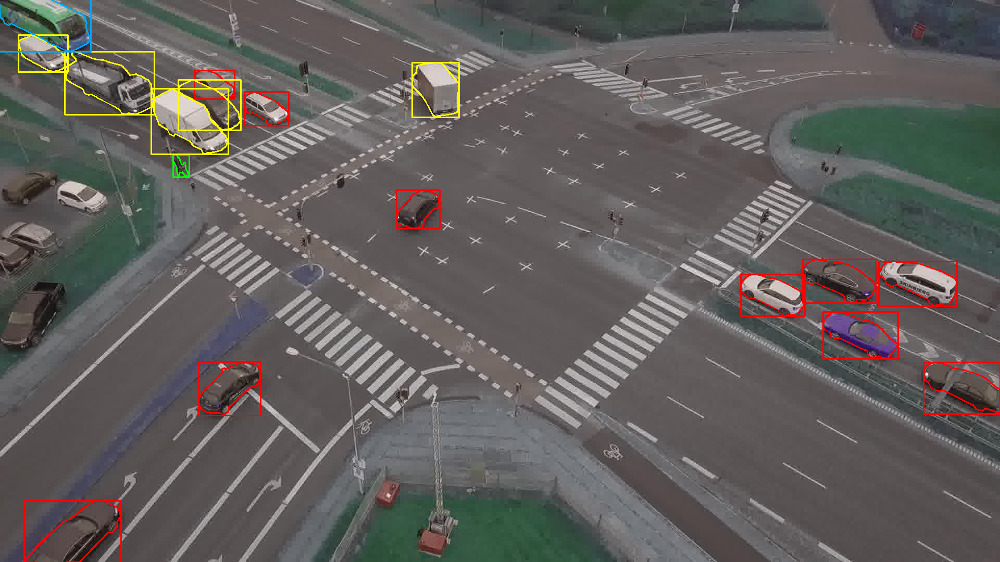

In [ ]:
import json
import numpy as np
import cv2

# Load COCO JSON annotations
annotations_path = '/content/drone-mscoco.json'
with open(annotations_path, 'r') as f:
    annotations = json.load(f)

# Map COCO class IDs to colors for the specified classes
class_colors = {
    2: (0, 255, 0),  # Green for Bicycle
    3: (0, 0, 255),  # Red for Car
    6: (255, 165, 0),  # Orange for Bus
    8: (0, 255, 255)  # Yellow for Lorry
}

# Select a single image's annotation
image_id = annotations['annotations'][1000]['image_id']  # Change the index to select a different image

# Find the image's information
image_info = next(image for image in annotations['images'] if image['id'] == image_id)
image_path = '/content/{}'.format(image_info['file_name'])

# Load and display the original image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Iterate through annotations for the selected image
for annotation in annotations['annotations']:
    if annotation['image_id'] == image_id:
        # Get class ID and color for the annotation
        class_id = annotation['category_id']
        bbox_color = class_colors.get(class_id, (255, 0, 0))  # Default to blue if class not in mapping

        # Draw bounding boxes on the image with class-specific color
        bbox = annotation['bbox']
        x, y, w, h = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
        cv2.rectangle(image, (x, y), (x + w, y + h), bbox_color, 2)

        # Draw segmentation mask on the image with class-specific color
        segmentation = annotation['segmentation'][0]
        points = np.array(segmentation).reshape(-1, 2)
        cv2.polylines(image, [points], isClosed=True, color=bbox_color, thickness=2)

# Display the result with colored bounding boxes and segmentation masks
cv2_imshow(image)


In [ ]:
import os

# Directory path for the new folder
new_directory = "/content/Drone/Labels"

# Create the empty folder
os.makedirs(new_directory, exist_ok=True)

print(f"Empty folder '{new_directory}' created.")


Empty folder '/content/Drone/Labels' created.


In [ ]:
import json
import os

# COCO class IDs for the classes you're interested in
coco_class_ids = [2, 3, 6, 8]

# Load the COCO annotation file
coco_annotation_file = "/content/drone-mscoco.json"  # Replace with your COCO annotation file
with open(coco_annotation_file, "r") as f:
    coco_data = json.load(f)

# YOLO class names corresponding to COCO class IDs
yolo_classes = ["Bicycle", "Car", "Bus", "Lorry"]

# Function to convert COCO bounding box to YOLO format
def convert_bbox(coco_bbox, img_width, img_height):
    x, y, w, h = coco_bbox
    x_center = x + w / 2
    y_center = y + h / 2
    x_center /= img_width
    y_center /= img_height
    w /= img_width
    h /= img_height
    return x_center, y_center, w, h

# Loop through images and annotations
for image in coco_data["images"]:
    img_width = image["width"]
    img_height = image["height"]
    image_id = image["id"]
    image_filename = os.path.basename(image["file_name"])  # Get the filename from the path

    # Collect annotations for the current image
    annotations = [
        ann
        for ann in coco_data["annotations"]
        if ann["image_id"] == image_id and ann["category_id"] in coco_class_ids
    ]

    yolo_annotations = []
    for ann in annotations:
        coco_bbox = ann["bbox"]
        yolo_bbox = convert_bbox(coco_bbox, img_width, img_height)
        class_idx = coco_class_ids.index(ann["category_id"])
        yolo_annotations.append((class_idx, *yolo_bbox))

    # Write YOLO annotations to a file with the desired filename format
    base_filename = os.path.splitext(image_filename)[0]  # Get the filename without extension
    yolo_annotation_file = os.path.join("/content/Drone/Labels", f"{base_filename}.txt")
    with open(yolo_annotation_file, "w") as f:
        for yolo_ann in yolo_annotations:
            f.write(f"{yolo_ann[0]} {yolo_ann[1]} {yolo_ann[2]} {yolo_ann[3]} {yolo_ann[4]}\n")


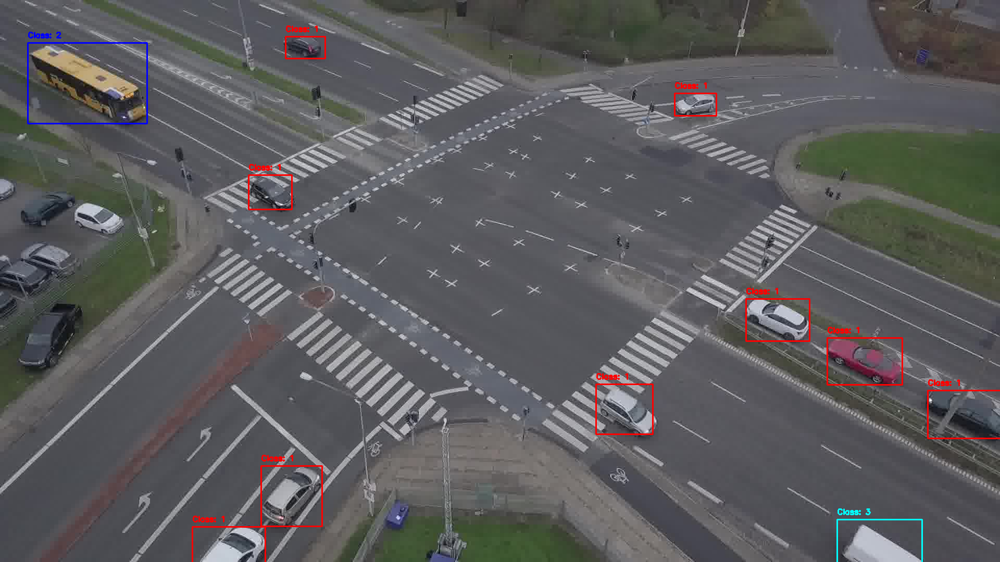

In [ ]:
import cv2
import numpy as np

# Define colors for different classes (BGR format)
class_colors = {
    0: (0, 255, 0),   # Green for class 0
    1: (0, 0, 255),   # Red for class 1
    2: (255, 0, 0),   # Blue for class 2
    3: (255, 255, 0)  # Yellow for class 3
    # Add more colors for additional classes
}

# Load the image
image_path = "/content/Drone/1000/seq3-drone_0001000.jpg"  # Replace with your image path
image = cv2.imread(image_path)

# Load YOLO format annotations from the text file
annotations_file = "/content/Drone/Labels/seq3-drone_0001000.txt"  # Replace with your annotation file path
with open(annotations_file, "r") as f:
    annotations = f.readlines()

# Loop through annotations and draw bounding boxes with different colors
for ann in annotations:
    class_idx, x_center, y_center, width, height = map(float, ann.strip().split())
    img_height, img_width, _ = image.shape

    # Convert YOLO coordinates to image coordinates
    x = int((x_center - width / 2) * img_width)
    y = int((y_center - height / 2) * img_height)
    w = int(width * img_width)
    h = int(height * img_height)

    # Get color for the current class
    color = class_colors.get(int(class_idx), (0, 0, 0))  # Default to black if class color is not defined

    # Draw the bounding box
    thickness = 2
    cv2.rectangle(image, (x, y), (x + w, y + h), color, thickness)
    cv2.putText(image, f"Class: {int(class_idx)}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Display the image with bounding boxes
cv2_imshow(image)


In [ ]:
import os

# Define the main directory path
main_directory = "Intersection_Dataset"

# Create the main directory
os.makedirs(main_directory, exist_ok=True)

# Define sub-directory paths
data_directory = os.path.join(main_directory, "Data")
images_directory = os.path.join(data_directory, "Images")
labels_directory = os.path.join(data_directory, "Labels")

# Create sub-directories
os.makedirs(data_directory, exist_ok=True)
os.makedirs(images_directory, exist_ok=True)
os.makedirs(labels_directory, exist_ok=True)

print("Directory structure created:")
print(main_directory)
print("|- Data")
print("|  |- Images")
print("|  |- Labels")

Directory structure created:
Intersection_Dataset
|- Data
|  |- Images
|  |- Labels


In [ ]:
import os
import shutil

# Source directories
source_directories = [
    "/content/Drone/0",
    "/content/Drone/1000",
    "/content/Drone/2000",
    "/content/Drone/3000",
    "/content/Drone/3100",
    "/content/Drone/3200",
    "/content/Drone/3300"
]

# Destination directory for images
destination_images_directory = "/content/Intersection_Dataset/Data/Images"

total_images_copied = 0

# Iterate through source directories, copy JPG images to the destination, and count them
for source_directory in source_directories:
    images_in_source = 0  # Count of images in the current source directory
    for root, _, files in os.walk(source_directory):
        for file in files:
            if file.lower().endswith(".jpg"):
                source_file_path = os.path.join(root, file)
                destination_file_path = os.path.join(destination_images_directory, file)
                shutil.copy(source_file_path, destination_file_path)
                images_in_source += 1
                total_images_copied += 1

    print(f"Copied {images_in_source} images from {source_directory}")

print(f"Total images copied: {total_images_copied}")

Copied 935 images from /content/Drone/0
Copied 1000 images from /content/Drone/1000
Copied 1000 images from /content/Drone/2000
Copied 100 images from /content/Drone/3000
Copied 100 images from /content/Drone/3100
Copied 100 images from /content/Drone/3200
Copied 100 images from /content/Drone/3300
Total images copied: 3335


In [ ]:
import os

# Directory containing txt files
labels_directory = "/content/Drone/Labels"

# Count the number of txt files
txt_file_count = len([filename for filename in os.listdir(labels_directory) if filename.lower().endswith(".txt")])

print(f"Number of txt files in {labels_directory}: {txt_file_count}")


Number of txt files in /content/Drone/Labels: 3335


In [ ]:
import os
import shutil

# Source directory for txt files
source_labels_directory = "/content/Drone/Labels"

# Destination directory for txt files
destination_labels_directory = "/content/Intersection_Dataset/Data/Labels"

# Iterate through txt files in the source directory and copy them to the destination
txt_file_count = 0
for filename in os.listdir(source_labels_directory):
    if filename.lower().endswith(".txt"):
        source_file_path = os.path.join(source_labels_directory, filename)
        destination_file_path = os.path.join(destination_labels_directory, filename)
        shutil.copy(source_file_path, destination_file_path)
        txt_file_count += 1

print(f"{txt_file_count} txt files copied from {source_labels_directory} to {destination_labels_directory}")

3335 txt files copied from /content/Drone/Labels to /content/Intersection_Dataset/Data/Labels


In [ ]:
import os

# Directory containing images
images_directory = "/content/Intersection_Dataset/Data/Images"

# Define ranges of file names to delete
ranges_to_delete = [
    (1, 31),       # seq3-drone_0000001.jpg to seq3-drone_0000031.jpg
    (659, 660),   # seq3-drone_0000659.jpg
    (1001, 1319), # seq3-drone_0001001.jpg to seq3-drone_0001318.jpg
    (3301, 3328)  # seq3-drone_0003301.jpg to seq3-drone_0003327.jpg
]

deleted_file_count = 0

# Get a list of all image files in the directory
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".jpg")]

# Iterate through the ranges and delete files
for start, end in ranges_to_delete:
    for i in range(start, end + 1):
        filename = f"seq3-drone_{i:07d}.jpg"
        if filename in image_files:
            file_path = os.path.join(images_directory, filename)
            os.remove(file_path)
            deleted_file_count += 1
            print(f"Deleted: {filename}")

remaining_files = len(image_files) - deleted_file_count
print(f"Total files deleted: {deleted_file_count}")
print(f"Total images remaining: {remaining_files}")

Deleted: seq3-drone_0000001.jpg
Deleted: seq3-drone_0000002.jpg
Deleted: seq3-drone_0000003.jpg
Deleted: seq3-drone_0000004.jpg
Deleted: seq3-drone_0000005.jpg
Deleted: seq3-drone_0000006.jpg
Deleted: seq3-drone_0000007.jpg
Deleted: seq3-drone_0000008.jpg
Deleted: seq3-drone_0000009.jpg
Deleted: seq3-drone_0000010.jpg
Deleted: seq3-drone_0000011.jpg
Deleted: seq3-drone_0000012.jpg
Deleted: seq3-drone_0000013.jpg
Deleted: seq3-drone_0000014.jpg
Deleted: seq3-drone_0000015.jpg
Deleted: seq3-drone_0000016.jpg
Deleted: seq3-drone_0000017.jpg
Deleted: seq3-drone_0000018.jpg
Deleted: seq3-drone_0000019.jpg
Deleted: seq3-drone_0000020.jpg
Deleted: seq3-drone_0000021.jpg
Deleted: seq3-drone_0000022.jpg
Deleted: seq3-drone_0000023.jpg
Deleted: seq3-drone_0000024.jpg
Deleted: seq3-drone_0000025.jpg
Deleted: seq3-drone_0000026.jpg
Deleted: seq3-drone_0000027.jpg
Deleted: seq3-drone_0000028.jpg
Deleted: seq3-drone_0000029.jpg
Deleted: seq3-drone_0000030.jpg
Deleted: seq3-drone_0000031.jpg
Deleted:

In [ ]:
import os

# Directory containing images
images_directory = "/content/Intersection_Dataset/Data/Labels"

# Define ranges of file names to delete
ranges_to_delete = [
    (1, 31),       # seq3-drone_0000001.jpg to seq3-drone_0000031.jpg
    (659, 660),   # seq3-drone_0000659.jpg
    (1001, 1319), # seq3-drone_0001001.jpg to seq3-drone_0001318.jpg
    (3301, 3328)  # seq3-drone_0003301.jpg to seq3-drone_0003327.jpg
]

deleted_file_count = 0

# Get a list of all image files in the directory
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".txt")]

# Iterate through the ranges and delete files
for start, end in ranges_to_delete:
    for i in range(start, end + 1):
        filename = f"seq3-drone_{i:07d}.txt"
        if filename in image_files:
            file_path = os.path.join(images_directory, filename)
            os.remove(file_path)
            deleted_file_count += 1
            print(f"Deleted: {filename}")

remaining_files = len(image_files) - deleted_file_count
print(f"Total files deleted: {deleted_file_count}")
print(f"Total files remaining: {remaining_files}")


Deleted: seq3-drone_0000001.txt
Deleted: seq3-drone_0000002.txt
Deleted: seq3-drone_0000003.txt
Deleted: seq3-drone_0000004.txt
Deleted: seq3-drone_0000005.txt
Deleted: seq3-drone_0000006.txt
Deleted: seq3-drone_0000007.txt
Deleted: seq3-drone_0000008.txt
Deleted: seq3-drone_0000009.txt
Deleted: seq3-drone_0000010.txt
Deleted: seq3-drone_0000011.txt
Deleted: seq3-drone_0000012.txt
Deleted: seq3-drone_0000013.txt
Deleted: seq3-drone_0000014.txt
Deleted: seq3-drone_0000015.txt
Deleted: seq3-drone_0000016.txt
Deleted: seq3-drone_0000017.txt
Deleted: seq3-drone_0000018.txt
Deleted: seq3-drone_0000019.txt
Deleted: seq3-drone_0000020.txt
Deleted: seq3-drone_0000021.txt
Deleted: seq3-drone_0000022.txt
Deleted: seq3-drone_0000023.txt
Deleted: seq3-drone_0000024.txt
Deleted: seq3-drone_0000025.txt
Deleted: seq3-drone_0000026.txt
Deleted: seq3-drone_0000027.txt
Deleted: seq3-drone_0000028.txt
Deleted: seq3-drone_0000029.txt
Deleted: seq3-drone_0000030.txt
Deleted: seq3-drone_0000031.txt
Deleted:

# Split data into 80:20 ratio

In [ ]:
import os
import random
import shutil

# Directory containing original data
data_directory = "/content/Intersection_Dataset/Data"

# Destination directories for train and validation data
train_directory = "/content/Intersection_Dataset/train"
val_directory = "/content/Intersection_Dataset/val"

# Create train and validation directories
os.makedirs(train_directory, exist_ok=True)
os.makedirs(val_directory, exist_ok=True)

# Define sub-directory paths
train_images_directory = os.path.join(train_directory, "Images")
train_labels_directory = os.path.join(train_directory, "Labels")
val_images_directory = os.path.join(val_directory, "Images")
val_labels_directory = os.path.join(val_directory, "Labels")

# Create sub-directories in train and validation directories
os.makedirs(train_images_directory, exist_ok=True)
os.makedirs(train_labels_directory, exist_ok=True)
os.makedirs(val_images_directory, exist_ok=True)
os.makedirs(val_labels_directory, exist_ok=True)

# Get list of image files
image_files = [f for f in os.listdir(os.path.join(data_directory, "Images")) if f.lower().endswith(".jpg")]

# Set the seed for reproducibility
random.seed(42)

# Shuffle the list of image files
random.shuffle(image_files)

# Calculate the split point
split_point = int(0.8 * len(image_files))

# Split image files into train and validation sets
train_image_files = image_files[:split_point]
val_image_files = image_files[split_point:]

# Move train images and labels to train directories
for filename in train_image_files:
    image_source_path = os.path.join(data_directory, "Images", filename)
    image_destination_path = os.path.join(train_images_directory, filename)
    label_source_path = os.path.join(data_directory, "Labels", filename.replace(".jpg", ".txt"))
    label_destination_path = os.path.join(train_labels_directory, filename.replace(".jpg", ".txt"))
    shutil.move(image_source_path, image_destination_path)
    shutil.move(label_source_path, label_destination_path)

# Move validation images and labels to validation directories
for filename in val_image_files:
    image_source_path = os.path.join(data_directory, "Images", filename)
    image_destination_path = os.path.join(val_images_directory, filename)
    label_source_path = os.path.join(data_directory, "Labels", filename.replace(".jpg", ".txt"))
    label_destination_path = os.path.join(val_labels_directory, filename.replace(".jpg", ".txt"))
    shutil.move(image_source_path, image_destination_path)
    shutil.move(label_source_path, label_destination_path)

print("Data split into train and validation sets.")

Data split into train and validation sets.


In [ ]:
import os

# Directories to rename
train_labels_directory = "/content/Intersection_Dataset/train/Labels"
val_labels_directory = "/content/Intersection_Dataset/val/Labels"

# New names for the directories
new_train_labels_directory = "/content/Intersection_Dataset/train/labels"
new_val_labels_directory = "/content/Intersection_Dataset/val/labels"

# Rename directories
os.rename(train_labels_directory, new_train_labels_directory)
os.rename(val_labels_directory, new_val_labels_directory)

print("Directories renamed.")

Directories renamed.


In [ ]:
import os

# Directories to rename
train_labels_directory = "/content/Intersection_Dataset/train/Images"
val_labels_directory = "/content/Intersection_Dataset/val/Images"

# New names for the directories
new_train_labels_directory = "/content/Intersection_Dataset/train/images"
new_val_labels_directory = "/content/Intersection_Dataset/val/images"

# Rename directories
os.rename(train_labels_directory, new_train_labels_directory)
os.rename(val_labels_directory, new_val_labels_directory)

print("Directories renamed.")

Directories renamed.


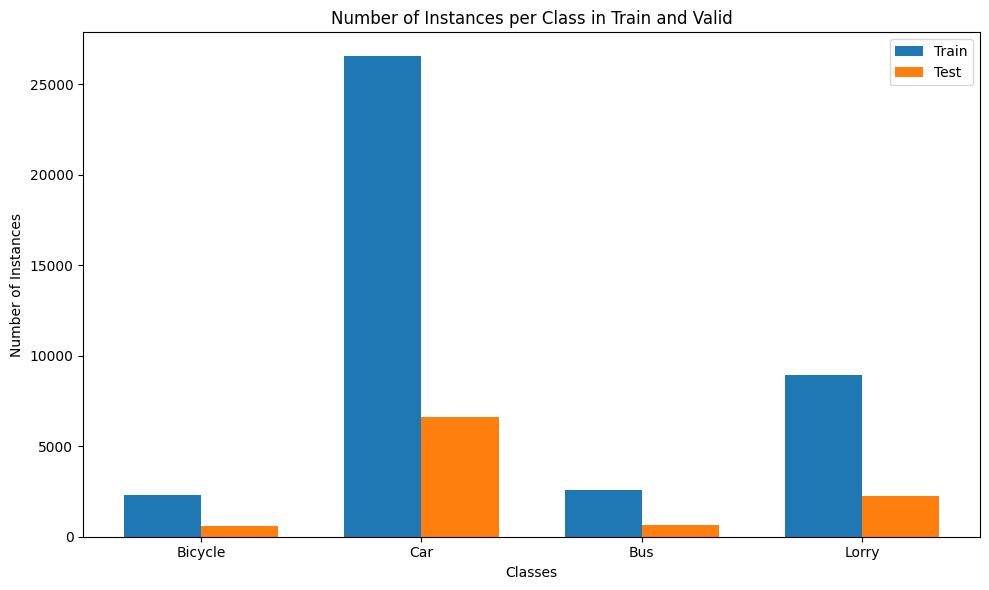

In [ ]:
import matplotlib.pyplot as plt

# Define class names and corresponding labels
class_names = ['Bicycle', 'Car', 'Bus', 'Lorry']

# Directory paths
dataset_root = '/content/Intersection_Dataset'
train_label_dir = os.path.join(dataset_root, 'train', 'labels')
valid_label_dir = os.path.join(dataset_root, 'val', 'labels')

# Count the number of instances for each class in train and valid folders
train_counts = [0] * len(class_names)
valid_counts = [0] * len(class_names)

# Process train label files
for label_file in os.listdir(train_label_dir):
    with open(os.path.join(train_label_dir, label_file), 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])
            train_counts[class_id] += 1

# Process valid label files
for label_file in os.listdir(valid_label_dir):
    with open(os.path.join(valid_label_dir, label_file), 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])
            valid_counts[class_id] += 1

# Plot the graph
fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.35
index = list(range(len(class_names)))

bar1 = ax.bar(index, train_counts, bar_width, label='Train')
bar2 = ax.bar([i + bar_width for i in index], valid_counts, bar_width, label='Test')

ax.set_xlabel('Classes')
ax.set_ylabel('Number of Instances')
ax.set_title('Number of Instances per Class in Train and Valid')
ax.set_xticks([i + bar_width/2 for i in index])
ax.set_xticklabels(class_names)
ax.legend()

plt.tight_layout()
plt.show()



# Training the YOLO v8 Model

In [ ]:
import os, time, random
import numpy as np
import pandas as pd
import cv2, torch
from tqdm.auto import tqdm
import shutil as sh

from IPython.display import Image, clear_output, display
import matplotlib.pyplot as plt
from IPython import display
%matplotlib inline

In [ ]:
%%time
!pip install ultralytics==8.0.11
!pip install roboflow --quiet
!pip install roboflow


display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.11 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.1/78.2 GB disk)


CPU times: user 1.5 s, sys: 203 ms, total: 1.7 s
Wall time: 31.8 s


In [ ]:
from ultralytics import YOLO

In [ ]:
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
def create_file_with_code(folder_path, file_name, code_content):
    # Create the folder if it doesn't exist
    os.makedirs(folder_path, exist_ok=True)

    # Create the full file path
    file_path = os.path.join(folder_path, file_name)

    # Write the code content into the file
    with open(file_path, 'w') as file:
        file.write(code_content)

# Example usage
folder_path = '/content/Intersection_Dataset'
file_name = 'data.yaml'
code_content = '''
train: /content/Intersection_Dataset/train
val: /content/Intersection_Dataset/val

nc: 4  # Number of classes (e.g., Car, Number Plate, Blur Number Plate, Two Wheeler, Auto, Bus, Truck)
names: ['Bicycle', 'Car', 'Bus', 'Lorry']

batch_size: 16
epochs: 25
'''

create_file_with_code(folder_path, file_name, code_content)

In [ ]:
! yolo task=detect mode=train model=yolov8s.pt data=/content/Intersection_Dataset/data.yaml epochs=10 imgsz=800 v5loader=True

100% 21.5M/21.5M [00:01<00:00, 17.2MB/s]

Ultralytics YOLOv8.0.11 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/Intersection_Dataset/data.yaml, epochs=10, patience=50, batch=16, imgsz=800, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, retina_masks=False, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify

In [ ]:
! yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/Intersection_Dataset/data.yaml

2023-10-01 12:12:53.005557: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-01 12:12:54.198030: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.11 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Fusing... 
Model summary: 168 layers, 11127132 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/Intersection_Dataset/val/labels... 591 images, 0 backgrounds, 244 corrupt: 100% 591/591 [00:00<00:00, 1753.20it/s]
val: WARNING ⚠️ /content/Intersection_Dataset/val/images/seq3-drone_0000036.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0122]
val: WARNING ⚠️ /content/Intersection_Dataset/val/images/seq3-drone_0000086.jp

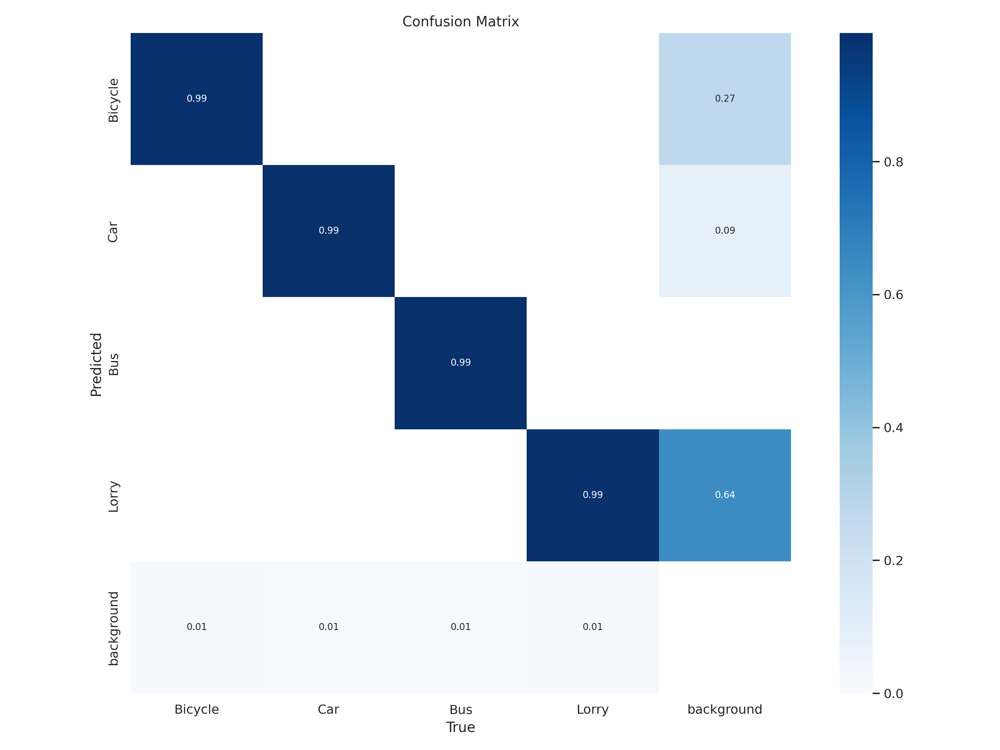

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

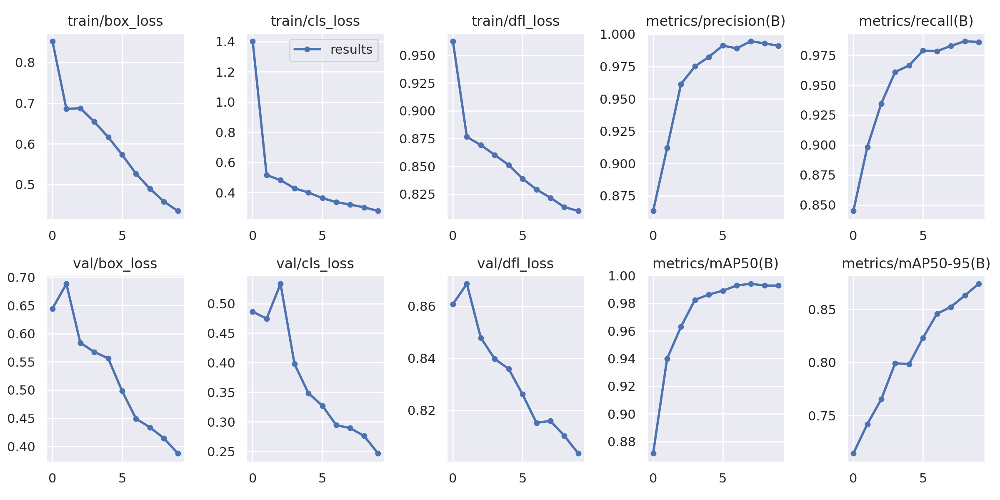

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [ ]:
import os

# Directory path for the empty "videos" folder
videos_directory = "/content/Intersection_Dataset/videos"

# Create the empty "videos" folder
os.makedirs(videos_directory, exist_ok=True)

print("Empty 'videos' folder created.")

Empty 'videos' folder created.


In [ ]:
import zipfile
import os

# Define the folder you want to zip
folder_to_zip = '/content/runs/detect'

# Specify the name of the output zip file
zip_file_name = 'model.zip'

# Create a ZipFile object in write mode ('w')
with zipfile.ZipFile(zip_file_name, 'w', zipfile.ZIP_DEFLATED) as zipf:
    # Walk through the folder and add all files and subdirectories to the zip file
    for root, dirs, files in os.walk(folder_to_zip):
        for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, folder_to_zip)
            zipf.write(file_path, arcname=arcname)

print(f'{zip_file_name} has been created successfully.')


model.zip has been created successfully.


# Convert Group of frames to Video

In [ ]:
import cv2
import os

# Directory containing JPG images
images_directory = "/content/Drone/0"

# Directory to save the video
output_video_directory = "/content/Intersection_Dataset/videos"

# Create the output directory if it doesn't exist
os.makedirs(output_video_directory, exist_ok=True)

# Get a list of JPG image files
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".jpg")]

# Sort image files in numerical order
image_files.sort()

# Get the dimensions of the first image
first_image_path = os.path.join(images_directory, image_files[0])
first_image = cv2.imread(first_image_path)
height, width, layers = first_image.shape

# Define the output video path
output_video_path = os.path.join(output_video_directory, "Video1.mp4")

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # You can change the codec if needed
video = cv2.VideoWriter(output_video_path, fourcc, 30.0, (width, height))

# Write each image to the video
for image_file in image_files:
    image_path = os.path.join(images_directory, image_file)
    image = cv2.imread(image_path)
    video.write(image)

# Release the VideoWriter object
video.release()

print(f"Video saved at: {output_video_path}")


Video saved at: /content/Intersection_Dataset/videos/Video1.mp4


In [ ]:
import cv2
import os

# Directory containing JPG images
images_directory = "/content/Drone/1000"

# Directory to save the video
output_video_directory = "/content/Intersection_Dataset/videos"

# Create the output directory if it doesn't exist
os.makedirs(output_video_directory, exist_ok=True)

# Get a list of JPG image files
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".jpg")]

# Sort image files in numerical order
image_files.sort()

# Get the dimensions of the first image
first_image_path = os.path.join(images_directory, image_files[0])
first_image = cv2.imread(first_image_path)
height, width, layers = first_image.shape

# Define the output video path
output_video_path = os.path.join(output_video_directory, "Video2.mp4")

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # You can change the codec if needed
video = cv2.VideoWriter(output_video_path, fourcc, 30.0, (width, height))

# Write each image to the video
for image_file in image_files:
    image_path = os.path.join(images_directory, image_file)
    image = cv2.imread(image_path)
    video.write(image)

# Release the VideoWriter object
video.release()

print(f"Video saved at: {output_video_path}")

Video saved at: /content/Intersection_Dataset/videos/Video2.mp4


In [ ]:
import cv2
import os

# Directory containing JPG images
images_directory = "/content/Drone/2000"

# Directory to save the video
output_video_directory = "/content/Intersection_Dataset/videos"

# Create the output directory if it doesn't exist
os.makedirs(output_video_directory, exist_ok=True)

# Get a list of JPG image files
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".jpg")]

# Sort image files in numerical order
image_files.sort()

# Get the dimensions of the first image
first_image_path = os.path.join(images_directory, image_files[0])
first_image = cv2.imread(first_image_path)
height, width, layers = first_image.shape

# Define the output video path
output_video_path = os.path.join(output_video_directory, "Video3.mp4")

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # You can change the codec if needed
video = cv2.VideoWriter(output_video_path, fourcc, 30.0, (width, height))

# Write each image to the video
for image_file in image_files:
    image_path = os.path.join(images_directory, image_file)
    image = cv2.imread(image_path)
    video.write(image)

# Release the VideoWriter object
video.release()

print(f"Video saved at: {output_video_path}")

Video saved at: /content/Intersection_Dataset/videos/Video3.mp4


In [ ]:
import cv2
import os

# Directory containing JPG images
images_directory = "/content/Drone/3000"

# Directory to save the video
output_video_directory = "/content/Intersection_Dataset/videos"

# Create the output directory if it doesn't exist
os.makedirs(output_video_directory, exist_ok=True)

# Get a list of JPG image files
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".jpg")]

# Sort image files in numerical order
image_files.sort()

# Get the dimensions of the first image
first_image_path = os.path.join(images_directory, image_files[0])
first_image = cv2.imread(first_image_path)
height, width, layers = first_image.shape

# Define the output video path
output_video_path = os.path.join(output_video_directory, "Video4.mp4")

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # You can change the codec if needed
video = cv2.VideoWriter(output_video_path, fourcc, 30.0, (width, height))

# Write each image to the video
for image_file in image_files:
    image_path = os.path.join(images_directory, image_file)
    image = cv2.imread(image_path)
    video.write(image)

# Release the VideoWriter object
video.release()

print(f"Video saved at: {output_video_path}")

Video saved at: /content/Intersection_Dataset/videos/Video4.mp4


In [ ]:
import cv2
import os

# Directory containing JPG images
images_directory = "/content/Drone/3100"

# Directory to save the video
output_video_directory = "/content/Intersection_Dataset/videos"

# Create the output directory if it doesn't exist
os.makedirs(output_video_directory, exist_ok=True)

# Get a list of JPG image files
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".jpg")]

# Sort image files in numerical order
image_files.sort()

# Get the dimensions of the first image
first_image_path = os.path.join(images_directory, image_files[0])
first_image = cv2.imread(first_image_path)
height, width, layers = first_image.shape

# Define the output video path
output_video_path = os.path.join(output_video_directory, "Video5.mp4")

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # You can change the codec if needed
video = cv2.VideoWriter(output_video_path, fourcc, 30.0, (width, height))

# Write each image to the video
for image_file in image_files:
    image_path = os.path.join(images_directory, image_file)
    image = cv2.imread(image_path)
    video.write(image)

# Release the VideoWriter object
video.release()

print(f"Video saved at: {output_video_path}")

Video saved at: /content/Intersection_Dataset/videos/Video5.mp4


In [ ]:
import cv2
import os

# Directory containing JPG images
images_directory = "/content/Drone/3200"

# Directory to save the video
output_video_directory = "/content/Intersection_Dataset/videos"

# Create the output directory if it doesn't exist
os.makedirs(output_video_directory, exist_ok=True)

# Get a list of JPG image files
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".jpg")]

# Sort image files in numerical order
image_files.sort()

# Get the dimensions of the first image
first_image_path = os.path.join(images_directory, image_files[0])
first_image = cv2.imread(first_image_path)
height, width, layers = first_image.shape

# Define the output video path
output_video_path = os.path.join(output_video_directory, "Video6.mp4")

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # You can change the codec if needed
video = cv2.VideoWriter(output_video_path, fourcc, 30.0, (width, height))

# Write each image to the video
for image_file in image_files:
    image_path = os.path.join(images_directory, image_file)
    image = cv2.imread(image_path)
    video.write(image)

# Release the VideoWriter object
video.release()

print(f"Video saved at: {output_video_path}")

Video saved at: /content/Intersection_Dataset/videos/Video6.mp4


In [ ]:
import cv2
import os

# Directory containing JPG images
images_directory = "/content/Drone/3300"

# Directory to save the video
output_video_directory = "/content/Intersection_Dataset/videos"

# Create the output directory if it doesn't exist
os.makedirs(output_video_directory, exist_ok=True)

# Get a list of JPG image files
image_files = [f for f in os.listdir(images_directory) if f.lower().endswith(".jpg")]

# Sort image files in numerical order
image_files.sort()

# Get the dimensions of the first image
first_image_path = os.path.join(images_directory, image_files[0])
first_image = cv2.imread(first_image_path)
height, width, layers = first_image.shape

# Define the output video path
output_video_path = os.path.join(output_video_directory, "Video7.mp4")

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # You can change the codec if needed
video = cv2.VideoWriter(output_video_path, fourcc, 30.0, (width, height))

# Write each image to the video
for image_file in image_files:
    image_path = os.path.join(images_directory, image_file)
    image = cv2.imread(image_path)
    video.write(image)

# Release the VideoWriter object
video.release()

print(f"Video saved at: {output_video_path}")

Video saved at: /content/Intersection_Dataset/videos/Video7.mp4


In [ ]:
import cv2
import os

def combine_videos(video_folder, output_video_path):
    video_files = [f for f in os.listdir(video_folder) if f.startswith('Video') and f.endswith('.mp4')]
    video_files.sort()  # Sort video files in the desired order

    # Get video properties from the first video
    cap = cv2.VideoCapture(os.path.join(video_folder, video_files[0]))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    for video_file in video_files:
        video_path = os.path.join(video_folder, video_file)
        cap = cv2.VideoCapture(video_path)
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            out.write(frame)
        cap.release()

    out.release()
    cv2.destroyAllWindows()

# Define the video folder and output video path
video_folder = '/content/Intersection_Dataset/videos'
output_video_path = os.path.join(video_folder, 'Big_Video.mp4')

# Call the function to combine videos
combine_videos(video_folder, output_video_path)

# Marking the Region Of Interest

#### Marking the Region Of Interest

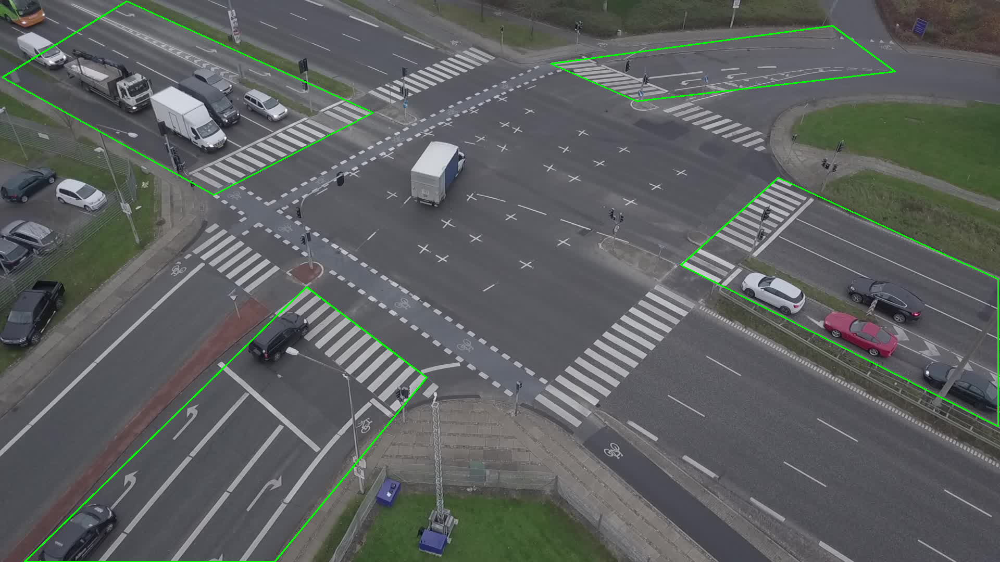

In [ ]:
import cv2
import numpy as np

# Load the image
image_path = "/content/Drone/0/seq3-drone_0000001.jpg"  # Replace with your image path
image = cv2.imread(image_path)

# Define coordinates for four quadrilaterals
quads = [
    np.array([(588, 551), (819, 725), (527, 1079), (47, 1079)], np.int32),
    np.array([(1307, 509), (1494, 341), (1916, 536), (1916, 819)], np.int32),
    np.array([(1057, 122), (1222, 194), (1718, 137), (1598, 49)], np.int32),
    np.array([(410, 374), (716, 216), (243, 2), (4, 148)], np.int32)
]

# Draw the quadrilaterals on the image
for quad in quads:
    quad = quad.reshape((-1, 1, 2))
    cv2.polylines(image, [quad], isClosed=True, color=(0, 255, 0), thickness=2)

# Display the image with the drawn quadrilaterals
cv2_imshow(image)

In [ ]:
import torch
import ultralytics

In [ ]:
model = YOLO('/content/runs/detect/train/weights/best.pt')  # load a custom model  # custom trained model

# Images
im = '/content/Intersection_Dataset/val/images/seq3-drone_0000379.jpg'  # or file, Path, URL, PIL, OpenCV, numpy, list

In [ ]:
from PIL import Image
import os
import random

# Define the folder path
folder_path = '/content/Intersection_Dataset/val/images'

# List all files in the folder
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Check if there are any image files in the folder
if not image_files:
    print("No image files found in the folder.")
else:
    # Select a random image file
    random_image = random.choice(image_files)

    # Get the full path to the random image
    random_image_path = os.path.join(folder_path, random_image)

    print("Random Image Path:", random_image_path)


image_path = random_image_path
image = Image.open(image_path)

Random Image Path: /content/Intersection_Dataset/val/images/seq3-drone_0001709.jpg


In [ ]:
detections = model(image)

In [ ]:
boxes = detections[0].boxes
for box in boxes:
    print(box.cls.item())
    print(box.xyxy.tolist()[0])
    print(box.conf.item())

In [ ]:
def get_class_label_from_index(class_index):
    class_labels = {
        0: 'Bicycle',  # Replace with actual class labels
        1: 'Car',
        2: 'Bus',
        3: 'Lorry'
        # Add more class indices and labels as needed
    }

    return class_labels.get(class_index, 'unknown')


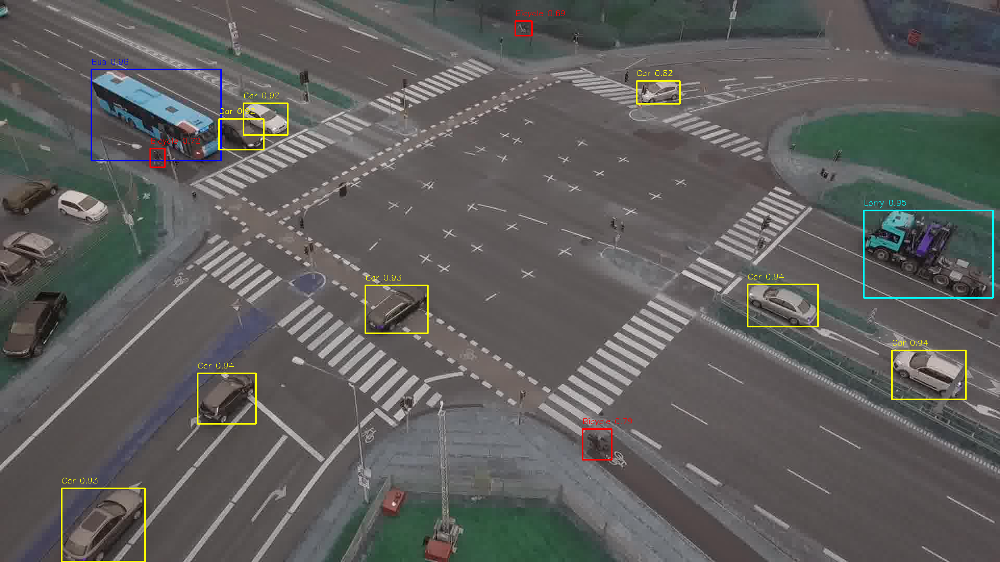

In [ ]:
import numpy as np
import cv2
from PIL import Image

# Load the image
image_path = random_image_path
image = Image.open(image_path)

# Convert PIL.Image to NumPy array
image_np = np.array(image)

# Define colors for different classes
class_colors = {
    0: (0, 0, 255),
    1: (0, 255, 255),
    2: (255, 0, 0),
    3: (255, 255, 0)
    # Add more class indices and colors as needed
}

# Assuming you have a list of detections
detections = model(image)

# Access detection results and display on image
for box in detections[0].boxes:
    class_index = int(box.cls.item())
    bounding_box = box.xyxy.tolist()[0]
    confidence_score = box.conf.item()

    class_label = get_class_label_from_index(class_index)
    class_color = class_colors.get(class_index, (0, 0, 0))  # Default color if not found

    # Draw bounding box and label on the image_np
    xmin, ymin, xmax, ymax = bounding_box
    cv2.rectangle(image_np, (int(xmin), int(ymin)), (int(xmax), int(ymax)), class_color, 2)
    cv2.putText(image_np, f'{class_label} {confidence_score:.2f}', (int(xmin), int(ymin) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, class_color, 1)

# Display the image using cv2_imshow
cv2_imshow(image_np)


In [ ]:
import numpy as np
import cv2
from PIL import Image

# Load the image
image_path = random_image_path
image = Image.open(image_path)

# Convert PIL.Image to NumPy array
image_np = np.array(image)

# List of quads representing regions of interest
quads = [
    np.array([(588, 551), (819, 725), (527, 1079), (47, 1079)], np.int32),
    np.array([(1307, 509), (1494, 341), (1916, 536), (1916, 819)], np.int32),
    np.array([(1057, 122), (1222, 194), (1718, 137), (1598, 49)], np.int32),
    np.array([(410, 374), (716, 216), (243, 2), (4, 148)], np.int32)
]

# Assuming you have a list of detections
detections = model(image)

# Create a list to store the vehicle counts for each quad
vehicle_counts = [0] * len(quads)

# Iterate through each detection
for box in detections[0].boxes:
    class_index = int(box.cls.item())
    if class_index in [0,1,2,3]:  # Vehicle class indices
        bounding_box = box.xyxy.tolist()[0]

        # Check if the center of the bounding box is inside any of the quads
        bbox_center = ((bounding_box[0] + bounding_box[2]) / 2, (bounding_box[1] + bounding_box[3]) / 2)
        for i, quad in enumerate(quads):
            if cv2.pointPolygonTest(quad, bbox_center, False) == 1:
                vehicle_counts[i] += 1

# Print the vehicle counts for each quad
for i, count in enumerate(vehicle_counts):
    print(f'Quad {i + 1}: {count} vehicles')


Quad 1: 2 vehicles
Quad 2: 3 vehicles
Quad 3: 1 vehicles
Quad 4: 4 vehicles


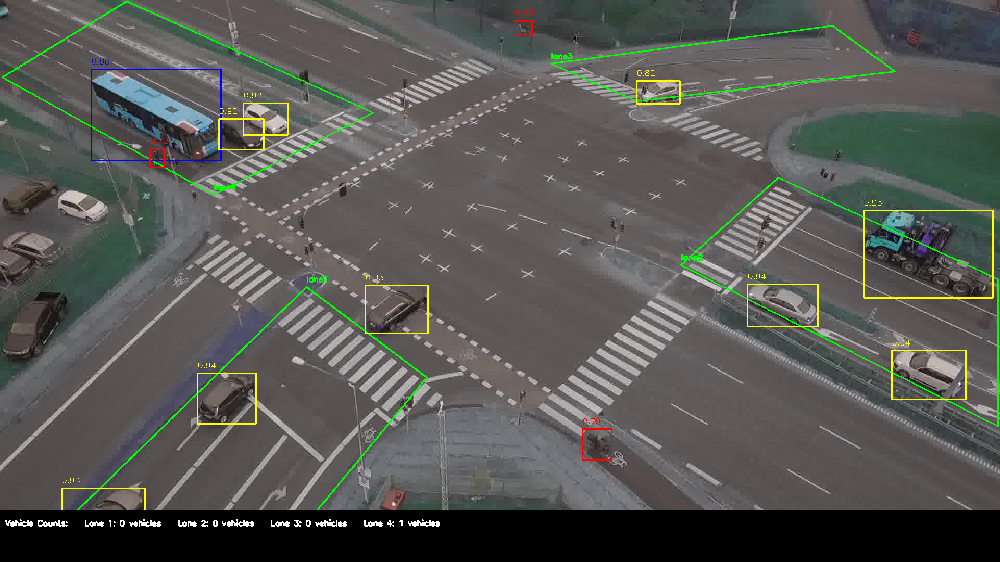

In [ ]:
import numpy as np
import cv2
from PIL import Image

# Load the image
image_path = random_image_path
image = Image.open(image_path)

# Convert PIL.Image to NumPy array
image_np = np.array(image)

# List of quads representing regions of interest
quads = [
    np.array([(588, 551), (819, 725), (527, 1079), (47, 1079)], np.int32),
    np.array([(1307, 509), (1494, 341), (1916, 536), (1916, 819)], np.int32),
    np.array([(1057, 122), (1222, 194), (1718, 137), (1598, 49)], np.int32),
    np.array([(410, 374), (716, 216), (243, 2), (4, 148)], np.int32)
]

# Define colors for different classes
class_colors = {
    0: (0, 0, 255),   # Red
    1: (0, 255, 255), # Orange/Yellow
    2: (255, 0, 0),   # Blue
    3: (0, 255, 255)  # Cyan
}

# ROI color (Green)
roi_color = (0, 255, 0)

# Assuming you have a list of detections
detections = model(image)

# Create a list to store the vehicle counts for each lane
vehicle_counts = [0] * len(quads)

# Iterate through each detection
for box in detections[0].boxes:
    class_index = int(box.cls.item())
    if class_index in [2, 5, 7]:  # Vehicle class indices
        bounding_box = box.xyxy.tolist()[0]

        # Check if the center of the bounding box is inside any of the quads
        bbox_center = ((bounding_box[0] + bounding_box[2]) / 2, (bounding_box[1] + bounding_box[3]) / 2)
        for i, quad in enumerate(quads):
            if cv2.pointPolygonTest(quad, bbox_center, False) == 1:
                vehicle_counts[i] += 1

# Draw regions of interest and lane names
for i, quad in enumerate(quads):
    lane_name = f'lane{i + 1}'
    lane_color = roi_color

    # Draw region of interest
    cv2.polylines(image_np, [quad], isClosed=True, color=lane_color, thickness=2)

    # Draw lane name
    cv2.putText(image_np, lane_name, (quad[0][0], quad[0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, lane_color, 2)

# Draw bounding boxes on vehicles
for box in detections[0].boxes:
    class_index = int(box.cls.item())
    bounding_box = box.xyxy.tolist()[0]
    confidence_score = box.conf.item()

    class_color = class_colors.get(class_index, (0, 0, 0))  # Default color if not found

    xmin, ymin, xmax, ymax = bounding_box
    cv2.rectangle(image_np, (int(xmin), int(ymin)), (int(xmax), int(ymax)), class_color, 2)
    cv2.putText(image_np, f'{confidence_score:.2f}', (int(xmin), int(ymin) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, class_color, 1)

# Draw vehicle count box at the bottom of the image
vehicle_count_text = 'Vehicle Counts:'
for i, count in enumerate(vehicle_counts):
    vehicle_count_text += f'    Lane {i + 1}: {count} vehicles'

bottom_box_height = 100
cv2.rectangle(image_np, (0, image_np.shape[0] - bottom_box_height), (image_np.shape[1], image_np.shape[0]), (0, 0, 0), -1)
cv2.putText(image_np, vehicle_count_text, (10, image_np.shape[0] - bottom_box_height + 30), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

# Display the image using cv2_imshow
cv2_imshow(image_np)


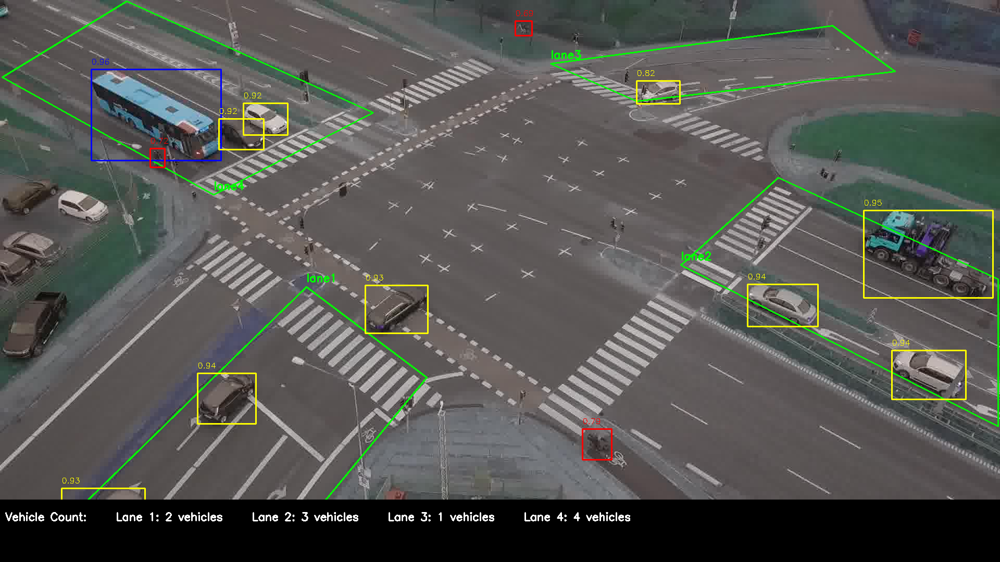

In [ ]:
import numpy as np
import cv2
from PIL import Image

# Load the image
image_path = random_image_path
image = Image.open(image_path)

# Convert PIL.Image to NumPy array
image_np = np.array(image)

# List of quads representing regions of interest
quads = [
    np.array([(588, 551), (819, 725), (527, 1079), (47, 1079)], np.int32),
    np.array([(1307, 509), (1494, 341), (1916, 536), (1916, 819)], np.int32),
    np.array([(1057, 122), (1222, 194), (1718, 137), (1598, 49)], np.int32),
    np.array([(410, 374), (716, 216), (243, 2), (4, 148)], np.int32)
]

# Define colors for different classes
class_colors = {
    0: (0, 0, 255),   # Red
    1: (0, 255, 255), # Orange/Yellow
    2: (255, 0, 0),   # Blue
    3: (0, 255, 255)  # Cyan
}

# ROI color (Green)
roi_color = (0, 255, 0)

# Assuming you have a list of detections
detections = model(image)

# Create a list to store the vehicle counts for each lane
vehicle_counts = [0] * len(quads)

# Iterate through each detection
for box in detections[0].boxes:
    class_index = int(box.cls.item())
    if class_index in [0, 1, 2, 3]:  # Vehicle class indices
        bounding_box = box.xyxy.tolist()[0]

        # Check if the center of the bounding box is inside any of the quads
        bbox_center = ((bounding_box[0] + bounding_box[2]) / 2, (bounding_box[1] + bounding_box[3]) / 2)
        for i, quad in enumerate(quads):
            if cv2.pointPolygonTest(quad, bbox_center, False) == 1:
                vehicle_counts[i] += 1

# Draw regions of interest and lane names
for i, quad in enumerate(quads):
    lane_name = f'lane{i + 1}'
    lane_color = roi_color

    # Draw region of interest
    cv2.polylines(image_np, [quad], isClosed=True, color=lane_color, thickness=2)

    # Draw lane name
    cv2.putText(image_np, lane_name, (quad[0][0], quad[0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, lane_color, 2)

# Draw bounding boxes on vehicles
for box in detections[0].boxes:
    class_index = int(box.cls.item())
    bounding_box = box.xyxy.tolist()[0]
    confidence_score = box.conf.item()

    class_color = class_colors.get(class_index, (0, 0, 0))  # Default color if not found

    xmin, ymin, xmax, ymax = bounding_box
    cv2.rectangle(image_np, (int(xmin), int(ymin)), (int(xmax), int(ymax)), class_color, 2)
    cv2.putText(image_np, f'{confidence_score:.2f}', (int(xmin), int(ymin) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, class_color, 1)

# Draw vehicle count box at the bottom of the image
vehicle_count_text = 'Vehicle Count:'
for i, count in enumerate(vehicle_counts):
    vehicle_count_text += f'     Lane {i + 1}: {count} vehicles'

bottom_box_height = 120
cv2.rectangle(image_np, (0, image_np.shape[0] - bottom_box_height), (image_np.shape[1], image_np.shape[0]), (0, 0, 0), -1)
cv2.putText(image_np, vehicle_count_text, (10, image_np.shape[0] - bottom_box_height + 40), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

# Display the image using cv2_imshow
cv2_imshow(image_np)


Ultralytics YOLOv8.0.11 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Fusing... 
Model summary: 168 layers, 11127132 parameters, 0 gradients, 28.4 GFLOPs


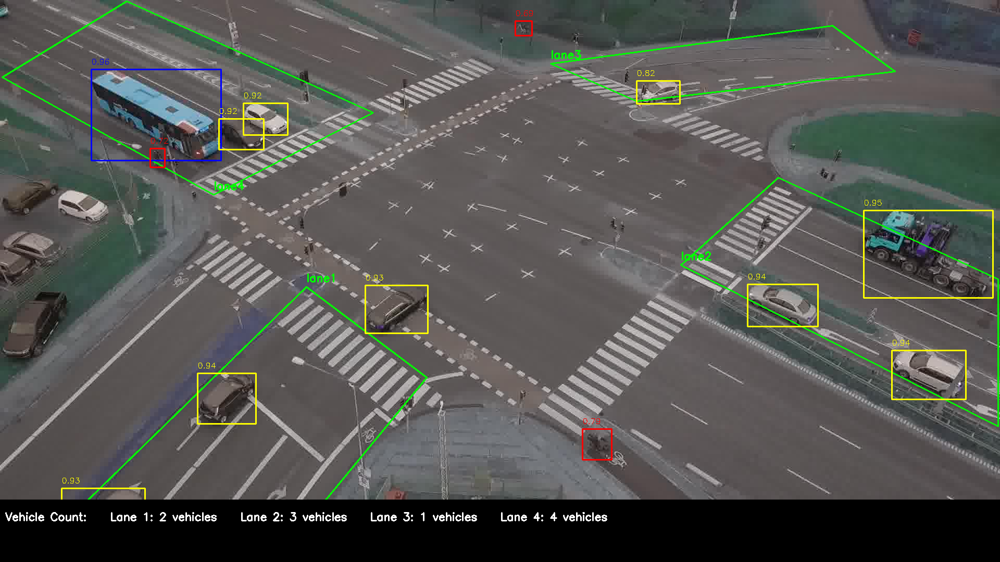

In [ ]:
import numpy as np
import cv2
from PIL import Image

def detect_and_analyze(image_path, model, quads):
    # Convert PIL.Image to NumPy array
    image = Image.open(image_path)
    image_np = np.array(image)

    # Define colors for different classes
    class_colors = {
        0: (0, 0, 255),   # Red
        1: (0, 255, 255), # Orange/Yellow
        2: (255, 0, 0),   # Blue
        3: (0, 255, 255)  # Cyan
    }

    # ROI color (Green)
    roi_color = (0, 255, 0)

    # Assuming you have a list of detections
    detections = model(image)

    # Create a list to store the vehicle counts for each lane
    vehicle_counts = [0] * len(quads)

    # Iterate through each detection
    for box in detections[0].boxes:
        class_index = int(box.cls.item())
        if class_index in [0, 1, 2, 3]:  # Vehicle class indices
            bounding_box = box.xyxy.tolist()[0]

            # Check if the center of the bounding box is inside any of the quads
            bbox_center = ((bounding_box[0] + bounding_box[2]) / 2, (bounding_box[1] + bounding_box[3]) / 2)
            for i, quad in enumerate(quads):
                if cv2.pointPolygonTest(quad, bbox_center, False) == 1:
                    vehicle_counts[i] += 1

    # Draw regions of interest and lane names
    for i, quad in enumerate(quads):
        lane_name = f'lane{i + 1}'
        lane_color = roi_color

        # Draw region of interest
        cv2.polylines(image_np, [quad], isClosed=True, color=lane_color, thickness=2)

        # Draw lane name
        cv2.putText(image_np, lane_name, (quad[0][0], quad[0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, lane_color, 2)

    # Draw bounding boxes on vehicles
    for box in detections[0].boxes:
        class_index = int(box.cls.item())
        bounding_box = box.xyxy.tolist()[0]
        confidence_score = box.conf.item()

        class_color = class_colors.get(class_index, (0, 0, 0))  # Default color if not found

        xmin, ymin, xmax, ymax = bounding_box
        cv2.rectangle(image_np, (int(xmin), int(ymin)), (int(xmax), int(ymax)), class_color, 2)
        cv2.putText(image_np, f'{confidence_score:.2f}', (int(xmin), int(ymin) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, class_color, 1)

    # Draw vehicle count box at the bottom of the image
    vehicle_count_text = 'Vehicle Count:'
    for i, count in enumerate(vehicle_counts):
        vehicle_count_text += f'    Lane {i + 1}: {count} vehicles'

    bottom_box_height = 120
    cv2.rectangle(image_np, (0, image_np.shape[0] - bottom_box_height), (image_np.shape[1], image_np.shape[0]), (0, 0, 0), -1)
    cv2.putText(image_np, vehicle_count_text, (10, image_np.shape[0] - bottom_box_height + 40), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

    # Display the image using cv2_imshow
    cv2_imshow(image_np)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Define your quads and model instance here
quads = [
    np.array([(588, 551), (819, 725), (527, 1079), (47, 1079)], np.int32),
    np.array([(1307, 509), (1494, 341), (1916, 536), (1916, 819)], np.int32),
    np.array([(1057, 122), (1222, 194), (1718, 137), (1598, 49)], np.int32),
    np.array([(410, 374), (716, 216), (243, 2), (4, 148)], np.int32)
]

# Define your YOLO model instance here
model = YOLO('/content/runs/detect/train/weights/best.pt')  # load a custom model  # custom trained model

# Provide the image path and call the function
image_path = random_image_path
detect_and_analyze(image_path, model, quads)


In [ ]:
import numpy as np
import cv2

def detect_and_analyze_video(input_video_path, output_video_path, model, quads):
    # Open input video
    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print("Error opening video file.")
        return

    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Define colors for different classes
    class_colors = {
        0: (0, 0, 255),   # Red
        1: (0, 255, 255), # Orange/Yellow
        2: (255, 0, 0),   # Blue
        3: (0, 255, 255)  # Cyan
    }

    # ROI color (Green)
    roi_color = (0, 255, 0)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert frame to PIL.Image format for processing
        image = Image.fromarray(frame)
        image_np = np.array(image)

        # Assuming you have a list of detections
        detections = model(image)

        # ... (rest of the processing code remains the same)
        # ... (iterate through detections, draw ROIs, bounding boxes, and vehicle counts)
        # Create a list to store the vehicle counts for each lane
        vehicle_counts = [0] * len(quads)

        # Iterate through each detection
        for box in detections[0].boxes:
            class_index = int(box.cls.item())
            if class_index in [0, 1, 2, 3]:  # Vehicle class indices
                bounding_box = box.xyxy.tolist()[0]

                # Check if the center of the bounding box is inside any of the quads
                bbox_center = ((bounding_box[0] + bounding_box[2]) / 2, (bounding_box[1] + bounding_box[3]) / 2)
                for i, quad in enumerate(quads):
                    if cv2.pointPolygonTest(quad, bbox_center, False) == 1:
                        vehicle_counts[i] += 1

        # Draw regions of interest and lane names
        for i, quad in enumerate(quads):
            lane_name = f'lane{i + 1}'
            lane_color = roi_color

            # Draw region of interest
            cv2.polylines(image_np, [quad], isClosed=True, color=lane_color, thickness=2)

            # Draw lane name
            cv2.putText(image_np, lane_name, (quad[0][0], quad[0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, lane_color, 2)

        # Draw bounding boxes on vehicles
        for box in detections[0].boxes:
            class_index = int(box.cls.item())
            bounding_box = box.xyxy.tolist()[0]
            confidence_score = box.conf.item()

            class_color = class_colors.get(class_index, (0, 0, 0))  # Default color if not found

            xmin, ymin, xmax, ymax = bounding_box
            cv2.rectangle(image_np, (int(xmin), int(ymin)), (int(xmax), int(ymax)), class_color, 2)
            cv2.putText(image_np, f'{confidence_score:.2f}', (int(xmin), int(ymin) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, class_color, 1)

        # Draw vehicle count box at the bottom of the image
        vehicle_count_text = 'Vehicle Count:'
        for i, count in enumerate(vehicle_counts):
            vehicle_count_text += f'    Lane {i + 1}: {count} vehicles'

        bottom_box_height = 120
        cv2.rectangle(image_np, (0, image_np.shape[0] - bottom_box_height), (image_np.shape[1], image_np.shape[0]), (0, 0, 0), -1)
        cv2.putText(image_np, vehicle_count_text, (10, image_np.shape[0] - bottom_box_height + 40), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

        # Convert the processed frame back to OpenCV format
        processed_frame = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
        out.write(processed_frame)

    cap.release()
    out.release()
    cv2.destroyAllWindows()

quads = [
    np.array([(588, 551), (819, 725), (527, 1079), (47, 1079)], np.int32),
    np.array([(1307, 509), (1494, 341), (1916, 536), (1916, 819)], np.int32),
    np.array([(1057, 122), (1222, 194), (1718, 137), (1598, 49)], np.int32),
    np.array([(410, 374), (716, 216), (243, 2), (4, 148)], np.int32)
]

# Define your YOLO model instance here
model = YOLO('/content/runs/detect/train/weights/best.pt')  # load a custom model  # custom trained model

In [ ]:
import os

folder_name = "/content/Processed_Videos"

if not os.path.exists(folder_name):
    os.makedirs(folder_name)
    print(f"Empty folder '{folder_name}' created.")
else:
    print(f"Folder '{folder_name}' already exists.")

Empty folder '/content/Processed_Videos' created.


In [ ]:
# Provide the input and output video paths and call the function
input_video_path = '/content/Intersection_Dataset/videos/Video1.mp4'
output_video_path = '/content/Processed_Videos/Output_Video1.mp4'
detect_and_analyze_video(input_video_path, output_video_path, model, quads)

In [ ]:
# Provide the input and output video paths and call the function
input_video_path = '/content/Intersection_Dataset/videos/Video2.mp4'
output_video_path = '/content/Processed_Videos/Output_Video2.mp4'
detect_and_analyze_video(input_video_path, output_video_path, model, quads)

In [ ]:
# Provide the input and output video paths and call the function
input_video_path = '/content/Intersection_Dataset/videos/Video3.mp4'
output_video_path = '/content/Processed_Videos/Output_Video3.mp4'
detect_and_analyze_video(input_video_path, output_video_path, model, quads)

In [ ]:
# Provide the input and output video paths and call the function
input_video_path = '/content/Intersection_Dataset/videos/Video4.mp4'
output_video_path = '/content/Processed_Videos/Output_Video4.mp4'
detect_and_analyze_video(input_video_path, output_video_path, model, quads)

In [ ]:
# Provide the input and output video paths and call the function
input_video_path = '/content/Intersection_Dataset/videos/Video5.mp4'
output_video_path = '/content/Processed_Videos/Output_Video5.mp4'
detect_and_analyze_video(input_video_path, output_video_path, model, quads)

In [ ]:
# Provide the input and output video paths and call the function
input_video_path = '/content/Intersection_Dataset/videos/Video6.mp4'
output_video_path = '/content/Processed_Videos/Output_Video6.mp4'
detect_and_analyze_video(input_video_path, output_video_path, model, quads)

In [ ]:
# Provide the input and output video paths and call the function
input_video_path = '/content/Intersection_Dataset/videos/Video7.mp4'
output_video_path = '/content/Processed_Videos/Output_Video7.mp4'
detect_and_analyze_video(input_video_path, output_video_path, model, quads)

In [ ]:
# Provide the input and output video paths and call the function
input_video_path = '/content/Intersection_Dataset/videos/Big_Video.mp4'
output_video_path = '/content/Processed_Videos/Output_Big_Video.mp4'
detect_and_analyze_video(input_video_path, output_video_path, model, quads)

# Save the Model and its result to zip format

In [ ]:
import zipfile
import os

# Define the folder path to be zipped
folder_to_zip = '/content/runs'

# Define the output ZIP file name
output_zip_file = '/content/runs.zip'

# Create a ZIP file and add the contents of the folder to it
with zipfile.ZipFile(output_zip_file, 'w', zipfile.ZIP_DEFLATED) as zipf:
    # Walk through all the files and subdirectories in the folder
    for root, _, files in os.walk(folder_to_zip):
        for file in files:
            file_path = os.path.join(root, file)
            # Add each file to the ZIP archive with its relative path
            zipf.write(file_path, os.path.relpath(file_path, folder_to_zip))

print(f"Folder '{folder_to_zip}' has been successfully compressed to '{output_zip_file}'.")
